In [1]:
include("speciale_tools.jl")
import JLD
import PyPlot

In [99]:
data_folder = "/home/data/simon/processed/test_areas/vejle_new/flood"
#figure_folder = "/home/data/simon/result/HSBA_ribe"

VV = [JLD.load(joinpath(data_folder,"VV_co.jld"),"data"),
    JLD.load(joinpath(data_folder,"VV_pre_median.jld"),"data")]


VH = [JLD.load(joinpath(data_folder,"VH_co.jld"),"data"), 
    JLD.load(joinpath(data_folder,"VH_pre_median.jld"),"data")];


In [100]:
threshold_indx = 3

3

## VV

In [101]:
co = VV[1][end:-1:1,:]
pre = VV[2][end:-1:1,:];

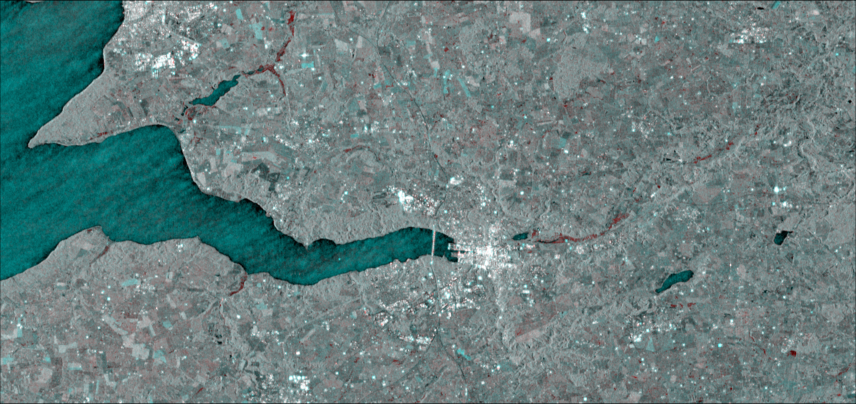

In [102]:
imgVV = pretty_img([co,pre],min_vv,max_vv)

In [103]:
flood_band = 10 .*log10.(co);
ref_band = 10 .*log10.(pre);
change_band = flood_band .- ref_band;

In [104]:
# Find the tiles to fit bimodal
bm_mask_flood = find_bimodal_tiles(flood_band);
bm_mask_change = find_bimodal_tiles(change_band);
bm_mask = bm_mask_change.&bm_mask_flood;


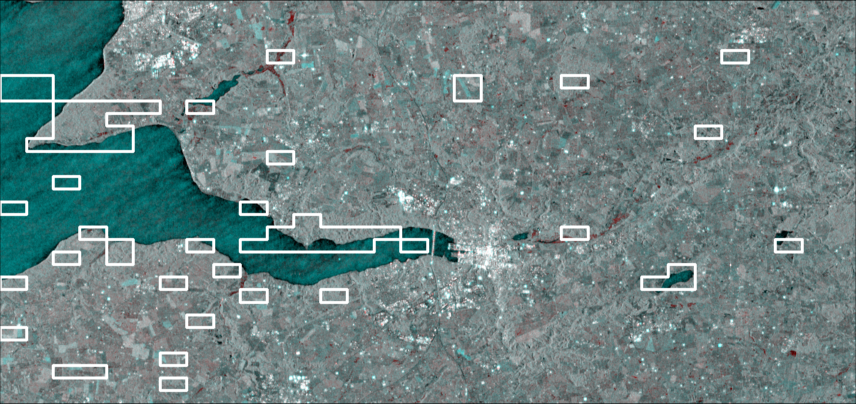

In [105]:
subset_edges = get_edges(bm_mask);
img_save = add_mask(imgVV,subset_edges,(1,1,1))

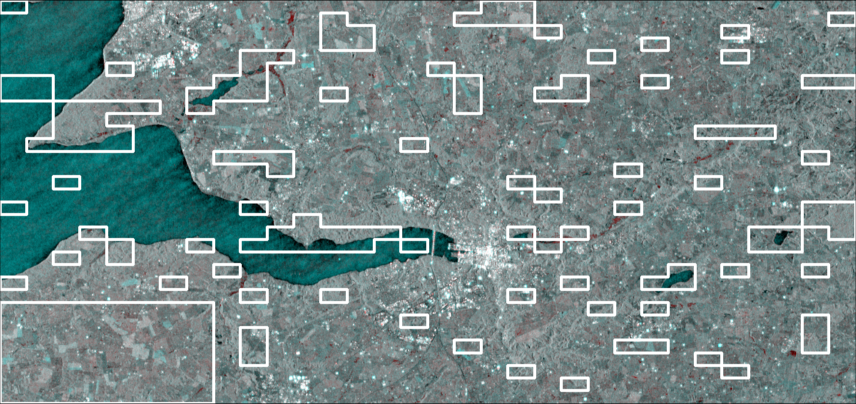

In [106]:
subset_edges = get_edges(bm_mask_flood);
img_save = add_mask(imgVV,subset_edges,(1,1,1))

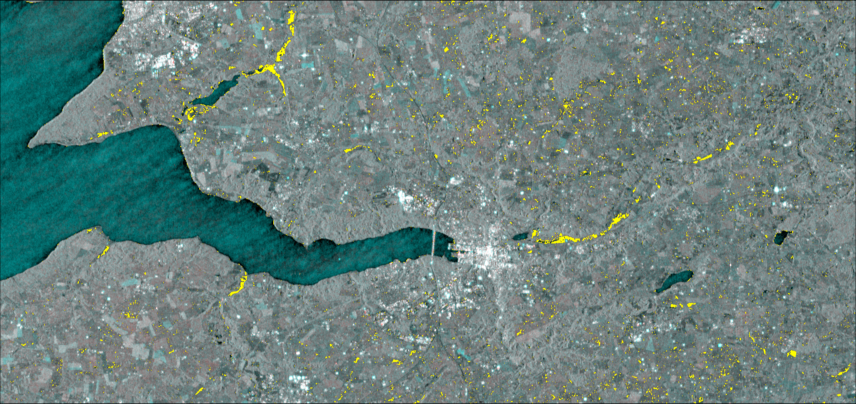

In [107]:
img_save = add_mask(imgVV,(change_band .< -0.5) .& (flood_band.<-13),(1,1,0))

In [108]:
function find_tiles_mask(mask; N_limit = (10^3, 3*10^5), min_frac=0.20)
    
    # initialize mask
    dims = size(mask)
    N =  dims[1]*dims[2]
    BM_mask = zeros(Bool,dims...)
    
    # If area is to small return false and exit function
    # serves as a lower limit for the recursive function
    if N < N_limit[1]
        return BM_mask
    end
    
    # If N is under max limit check for bimodal 
    bm_tile = false
    if N < N_limit[2]        
        bm_tile = Statistics.mean(mask) .> min_frac
    end
    
    
    if bm_tile
        BM_mask .= true
    else
        # If tile not bimodal, Split it in 4 and try again
        row_split = floor(Int64,dims[1]/2)
        col_split = floor(Int64,dims[2]/2)
        
        tiles = [(1:row_split,1:col_split),((row_split+1):dims[1],1:col_split),
            (1:row_split,(col_split+1):dims[2]),((row_split+1):dims[1],(col_split+1):dims[2])]
        
        for elem in tiles
            BM_mask[elem...] .= find_tiles_mask(mask[elem...], N_limit =N_limit, min_frac=min_frac)
        end
        
    end
    
    return BM_mask
end

find_tiles_mask (generic function with 1 method)

In [129]:
tile_test = ((change_band .< -0.5) .& (flood_band.<-13))
test_mask = find_tiles_mask(tile_test,N_limit = (10^2, 3*10^5) , min_frac=0.10);


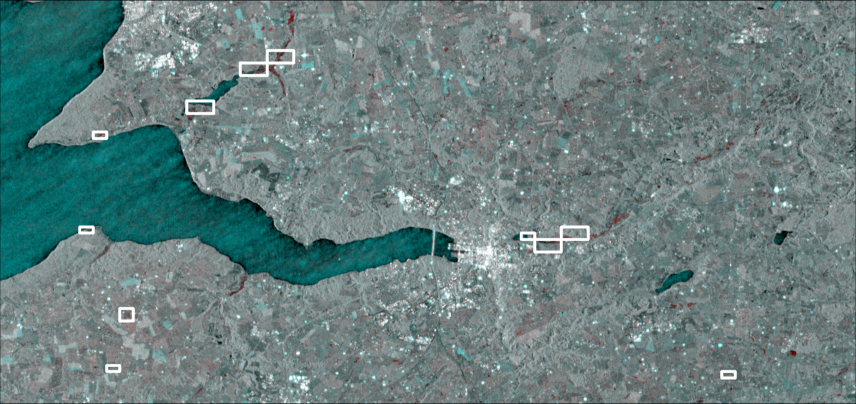

In [130]:
subset_edges = get_edges(test_mask .& bm_mask_flood);
img_save = add_mask(imgVV,subset_edges,(1,1,1))

In [111]:
bm_mask = test_mask .& bm_mask_flood;

In [131]:
# fit bimodel
data = reshape(flood_band,:)[reshape(bm_mask,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

# Find seed pixels
y_seed =find_y_seed(p_fit,y)
seed_mask = flood_band .<y_seed;


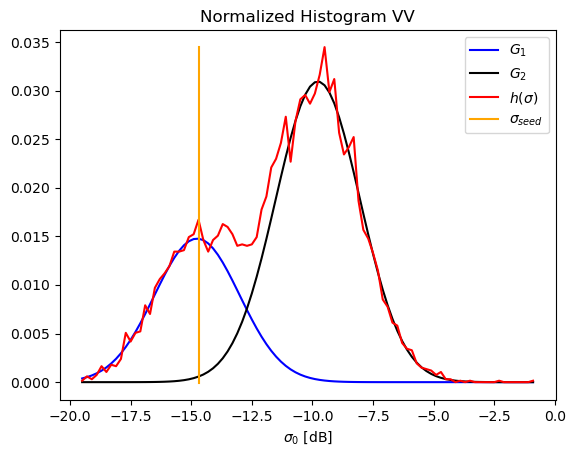

PyObject <matplotlib.legend.Legend object at 0x7fc3919a9100>

In [132]:
#file_path = joinpath(figure_folder,"VV_histogram_tiles_tuned.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VV")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

In [114]:
function sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_water,w_sum,edges,y, rg_thresholds)
    #use region growinf
    
    rg_mask = (flood_band .<rg_thresholds[1]) .& (change_band.<rg_thresholds[2])
    rg_flood, steps = region_growing(flood_band .< y_seed,rg_mask);
    
    
    rg_mask_ref = (ref_band .<rg_thresholds[1])
    rg_ref, steps = region_growing(ref_band .<y_seed,rg_mask_ref);
    
    # Remove flase positives and permant water.
    rg_mask= rg_flood .& (rg_ref .!=true);
    
    # select the water pixelss in the selected tiles
    data = reshape(flood_band,:)[reshape(rg_mask.&bm_mask,:)];
    
    # Compare histogram with the emepircal in p_water
    h = StatsBase.fit(StatsBase.Histogram, data,edges)
    w_sel = h.weights./w_sum;
    w_water_est = gauss_model(y,p_water)
    
    # return sum of squred errors
    SSE = (w_sel .- w_water_est)'*(w_sel .- w_water_est)
    return SSE
end

sse_water_fit2 (generic function with 1 method)

In [98]:
sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, t_0)

0.0011331763934709295

In [144]:
test_sigma = collect(LinRange(y_seed,-10,20))
test_dsigma = collect(LinRange(-3,3,20))
@time loss = [sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, [r1,r2])
    for r1=test_sigma, r2=test_dsigma];

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_gr

In [145]:
minimum(loss),maximum(loss)

(0.0011238288314443915, 0.002076685043689081)

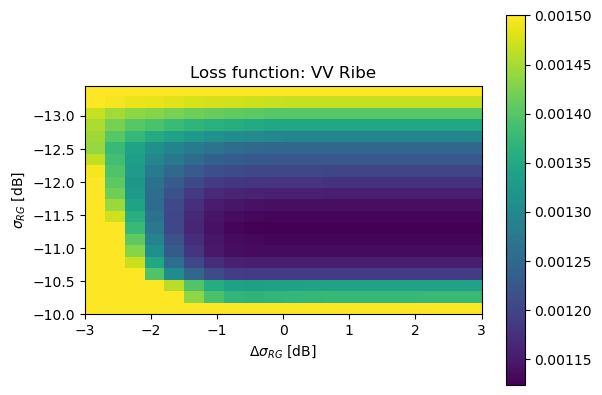

PyObject Text(0.5, 1.0, 'Loss function: VV Ribe')

In [147]:
#file_path = joinpath(figure_folder,"VV_loss_function.png")
PyPlot.figure(0.001)
PyPlot.imshow(loss,vmin=0.0011238,vmax=0.0015
    ,extent=[test_dsigma[1],test_dsigma[end],test_sigma[end],test_sigma[1]])
PyPlot.xlabel("\$\\Delta \\sigma_{RG} \$ [dB]")
PyPlot.ylabel("\$\\sigma_{RG} \$ [dB]")
PyPlot.colorbar()
PyPlot.title("Loss function: VV Ribe")
#PyPlot.savefig(file_path)

In [43]:
t_0 = [y_seed+1, -1]
thresholds3, n_iter = grad_decent(
            (t1,t2) -> sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, [t1,t2])
            ,t_0,debug=true)
f3 = sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y,thresholds3);


Iterration : 1
x_i: [-12.65, -1.0], f_i: 0.00013639885465942519
dfdx: [0.0, 0.0]

Iterration : 2
x_i: [-12.65, -1.0], f_i: 0.00013639885465942519
dfdx: [0.0, -3.130927349236848e-5]
Step x, step_idx:5,  no_step: -2

Iterration : 3
x_i: [-12.65, 30.309273492368483], f_i: 9.564768225779815e-5
dfdx: [-4.5219632212548245e-5, 0.0]
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Step x, step_idx:3,  no_step: -2

Iterration : 4
x_i: [-12.197803677874518, 30.309273492368483], f_i: 8.259402112681135e-5
dfdx: [-1.5094530299487548e-5, 0.0]
Max Iter reached:  region_growing()
Step x, step_idx:3,  no_step: -2

Iterration : 5
x_i: [-12.046858374879642, 30.309273492368483], f_i: 8.086440703703056e-5
dfdx: [-8.442495669808905e-6, 0.0]
Max Iter reached:  region_growing()
Step x, step_idx:3,  no_step: -2
Max Iter reached:  region_growing()

Iterration : 6
x_i: [-11.962433418181552, 30.309273492368483], f_i: 8.037210224943624e-5
dfdx: [1.7991483346535994e-5, 0.0]
Step x, step_idx:

In [44]:
thresholds3, f3

([-11.948387497746245, 30.3152732941629], 8.016653120559034e-5)

In [115]:
t_0 = [y_seed+1, -1]
res = Optim.optimize(
    t -> sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, t), 
    t_0; autodiff = :forward,store_trace = true,trace_simplex=true)
thresholds1 = res.minimizer
f1 = sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_fit[[1,3,5]],w_sum,edges,y,thresholds1)
thresholds1, f1

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()


([-13.467348480224643, 0.24504127502441236], 0.0014470252296462194)

In [46]:
res = Optim.optimize(
    t -> sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, [t,10]),
    y_seed, p_fit[4])

y_RG = res.minimizer
res = Optim.optimize(
    t -> sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, [y_RG,t]),
    -5, 2)
thresholds2 = [y_RG, res.minimizer]
f2 = sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y,thresholds2)
thresholds2, f2

([-11.910370764291905, 1.9907355870396475], 0.00010040156486329262)

In [47]:
rg_thresholds = [thresholds1,thresholds2,thresholds3][threshold_indx];

In [63]:
#y_seed =-15
rg_thresholds = [-12.8,-1]
seed_mask = flood_band .< y_seed;
y_seed

-13.65

In [116]:
rg_thresholds = thresholds1

2-element Array{Float64,1}:
 -13.467348480224643  
   0.24504127502441236

In [117]:
rg_mask = (flood_band .<rg_thresholds[1]) .& (change_band.<rg_thresholds[2]) .| seed_mask 
flood_mask, steps = region_growing(seed_mask,rg_mask);

In [118]:
# select the water pixelss in the selected tiles
data = reshape(flood_band,:)[reshape(rg_mask.&bm_mask,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

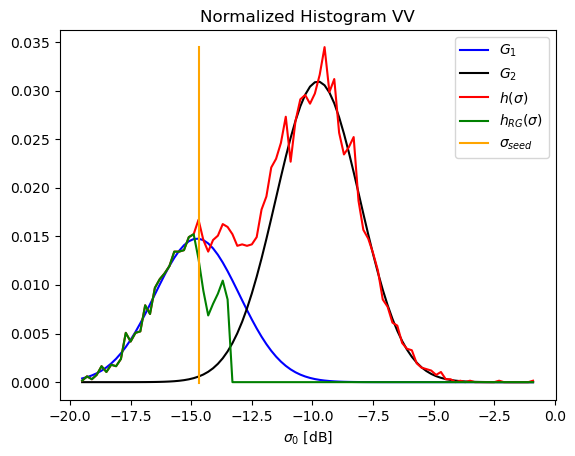

PyObject <matplotlib.legend.Legend object at 0x7fc392a13160>

In [119]:
#file_path = joinpath(figure_folder,"VV_histogram_flood_tuned.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VV")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

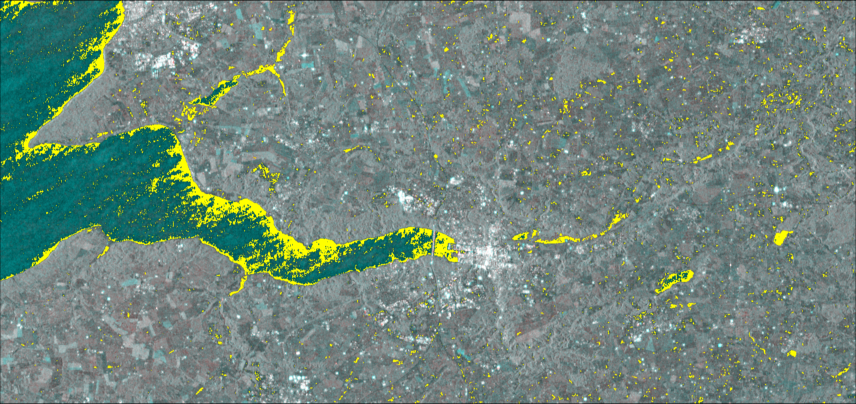

In [120]:
img_save = add_mask(imgVV,flood_mask,(1,1,0))
#file_path = joinpath(figure_folder,"VV_flood_noref_tuned")
#FileIO.save(file_path*".png",img_save)
#img_save

In [121]:
seed_mask_ref = ref_band .<y_seed
rg_mask_ref = (ref_band .<rg_thresholds[1]) .| seed_mask_ref
ref_mask, steps = region_growing(seed_mask_ref,rg_mask_ref);
    
# Remove flase positives and permant water.
final_mask = flood_mask .& (ref_mask .!=true);

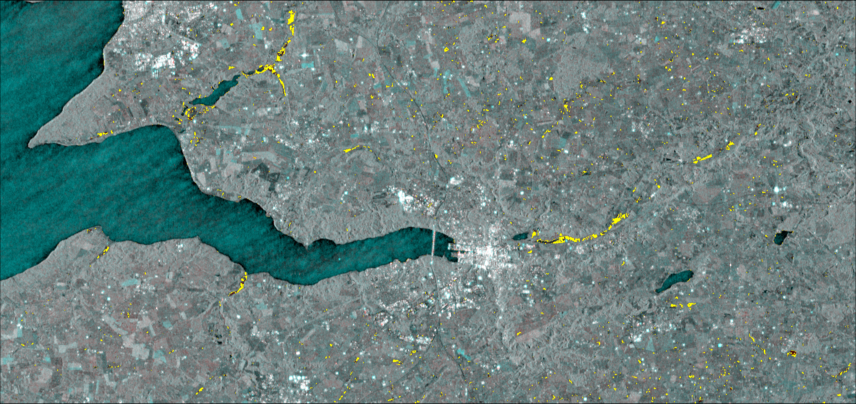

In [122]:
img_save = add_mask(imgVV,final_mask,(1,1,0))

#file_path = joinpath(figure_folder,"VV_flood_tuned")
#FileIO.save(file_path*".png",img_save)
#img_save

In [113]:
#file_path = joinpath(data_folder,"VVhand_tuned_mask")
#JLD.save(file_path*".jld", "data", final_mask)

## VH

In [157]:
co = VH[1][end:-1:1,:]
pre = VH[2][end:-1:1,:];

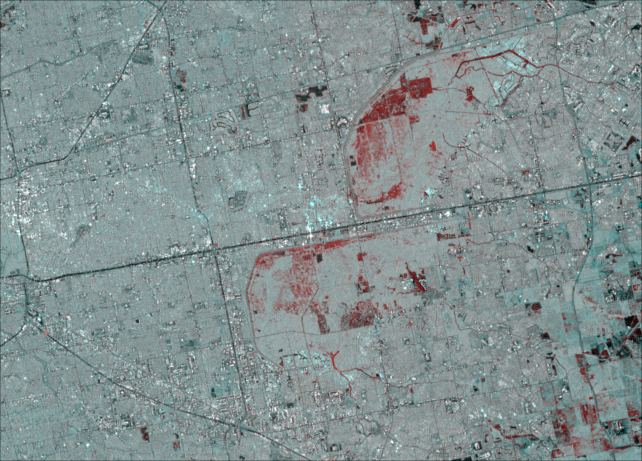

In [158]:
imgVH = pretty_img([co,pre],min_vh,max_vh)

In [159]:
flood_band = 10 .*log10.(co);
ref_band = 10 .*log10.(pre);
change_band = flood_band .- ref_band;

In [160]:
# Find the tiles to fit bimodal
bm_mask_flood = find_bimodal_tiles(flood_band);
bm_mask_change = find_bimodal_tiles(change_band);
bm_mask = bm_mask_change.&bm_mask_flood;


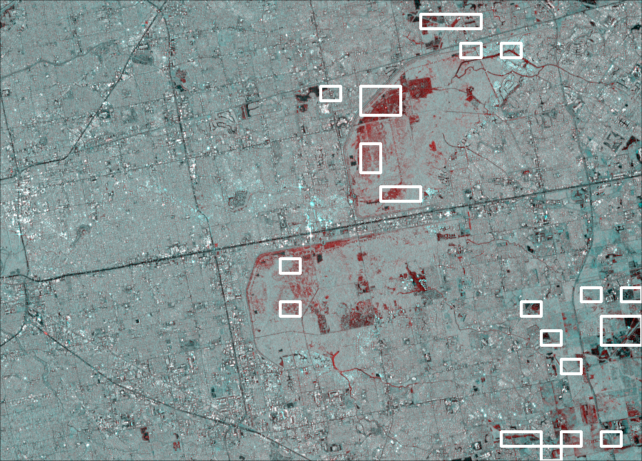

In [161]:
subset_edges = get_edges(bm_mask);
img_save = add_mask(imgVH,subset_edges,(1,1,1))

#file_path = joinpath(figure_folder,"VH_tile_select_median")
#FileIO.save(file_path*".png",img_save)
img_save

In [162]:
# fit bimodel
data = reshape(flood_band,:)[reshape(bm_mask,:)]
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(data,round(Int64,length(data)/50))

# Find seed pixels
y_seed =find_y_seed(p_fit,y)
seed_mask = flood_band .<y_seed;


In [164]:
test_sigma = collect(LinRange(y_seed,-17,20))
test_dsigma = collect(LinRange(-3,3,20))
@time loss = [sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, [r1,r2])
    for r1=test_sigma, r2=test_dsigma];

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_gr

In [165]:
minimum(loss),maximum(loss)

(0.00040524404924219, 0.0006905205194140228)

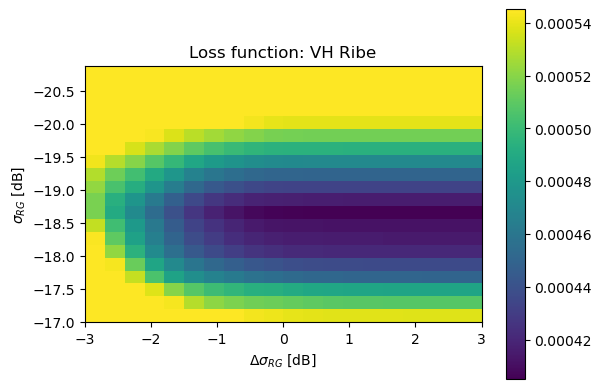

PyObject Text(0.5, 1.0, 'Loss function: VH Ribe')

In [167]:
#file_path = joinpath(figure_folder,"VH_loss_function.png")
PyPlot.figure(0.001)
PyPlot.imshow(loss,vmin=0.00040524,vmax=0.000545
    ,extent=[test_dsigma[1],test_dsigma[end],test_sigma[end],test_sigma[1]])
PyPlot.xlabel("\$\\Delta \\sigma_{RG} \$ [dB]")
PyPlot.ylabel("\$\\sigma_{RG} \$ [dB]")
PyPlot.colorbar()
PyPlot.title("Loss function: VH Ribe")
#PyPlot.savefig(file_path)

In [168]:
t_0 = [y_seed+1, -1]
res = Optim.optimize(
    t -> sse_water_fit2(flood_band,change_band,ref_band,y_seed,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, t), 
    t_0; autodiff = :forward,store_trace = true,trace_simplex=true)
thresholds1 = res.minimizer
f1 = sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y,thresholds1)
thresholds1, f1

Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()
Max Iter reached:  region_growing()


([-18.518955575628308, 1.0192287089768786], 0.00020048474642991485)

In [71]:
res = Optim.optimize(
    t -> sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, [t,10]),
    y_seed, p_fit[4])

y_RG = res.minimizer
res = Optim.optimize(
    t -> sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y, [y_RG,t]),
    -5, 2)
thresholds2 = [y_RG, res.minimizer]
f2 = sse_water_fit(flood_band,change_band,seed_mask,bm_mask, p_fit[[1,3,5]],w_sum,edges,y,thresholds2)
thresholds2, f2

([-21.228905829465873, 0.3475241677502607], 7.706502497087276e-6)

In [72]:
rg_thresholds = [thresholds1,thresholds2,thresholds3][threshold_indx];

In [45]:
#y_seed =-15
rg_thresholds = [-20,-1.5]
seed_mask = flood_band .< y_seed;
y_seed

-22.41

In [169]:
rg_thresholds = thresholds1

2-element Array{Float64,1}:
 -18.518955575628308 
   1.0192287089768786

In [170]:
rg_mask = (flood_band .<rg_thresholds[1]) .& (change_band.<rg_thresholds[2]) .| seed_mask 
flood_mask, steps = region_growing(seed_mask,rg_mask);

In [171]:
# select the water pixelss in the selected tiles
data = reshape(flood_band,:)[reshape(rg_mask.&bm_mask,:)];
    
# Compare histogram with the emepircal in p_water
h = StatsBase.fit(StatsBase.Histogram, data,edges)
w_sel = h.weights./w_sum;

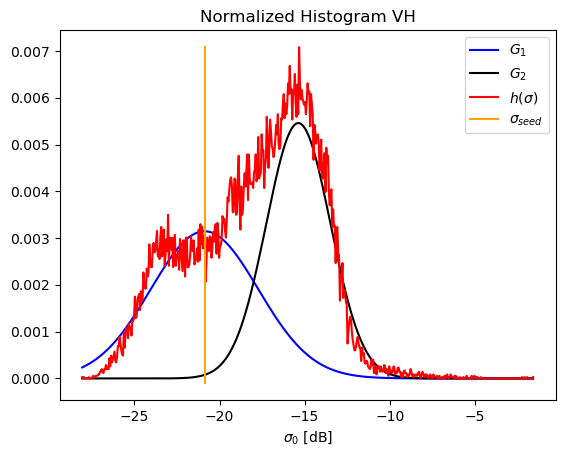

PyObject <matplotlib.legend.Legend object at 0x7f9a8aa90970>

In [172]:
#file_path = joinpath(figure_folder,"VH_histogram_tiles_tuned.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VH")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

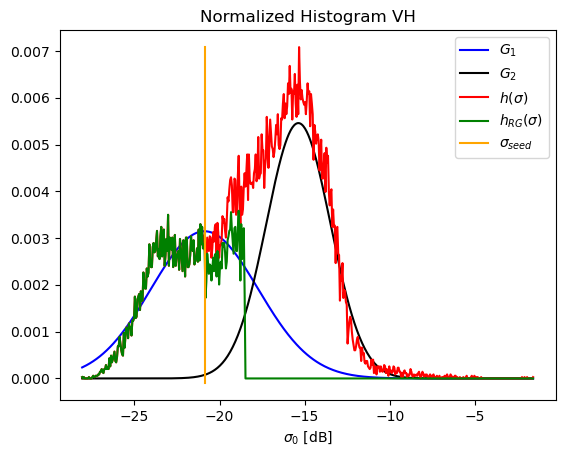

PyObject <matplotlib.legend.Legend object at 0x7f9a8a9c5160>

In [173]:
#file_path = joinpath(figure_folder,"VH_histogram_flood_tuned.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")
PyPlot.plot(y,w_sel,color="g")
PyPlot.plot(ones(8)*(y_seed),LinRange(minimum(w)-0.0001,maximum(w),8),color="orange")

PyPlot.xlabel("\$\\sigma_0 \$ [dB]")
PyPlot.title("Normalized Histogram VH")
PyPlot.legend(["\$ G_1 \$","\$ G_2 \$","\$ h(\\sigma) \$","\$ h_{RG}(\\sigma) \$" ,"\$\\sigma_{seed} \$"])

#PyPlot.savefig(file_path)

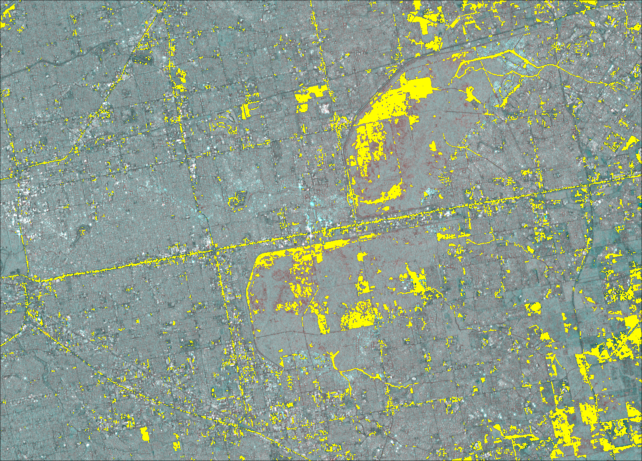

In [174]:
img_save = add_mask(imgVH,flood_mask,(1,1,0))
#file_path = joinpath(figure_folder,"VH_flood_noref_tuned")
#FileIO.save(file_path*".png",img_save)
#img_save

In [175]:
seed_mask_ref = ref_band .<y_seed
rg_mask_ref = (ref_band .<rg_thresholds[1]) .| seed_mask_ref
ref_mask, steps = region_growing(seed_mask_ref,rg_mask_ref);
    
# Remove flase positives and permant water.
final_mask = flood_mask .& (ref_mask .!=true);

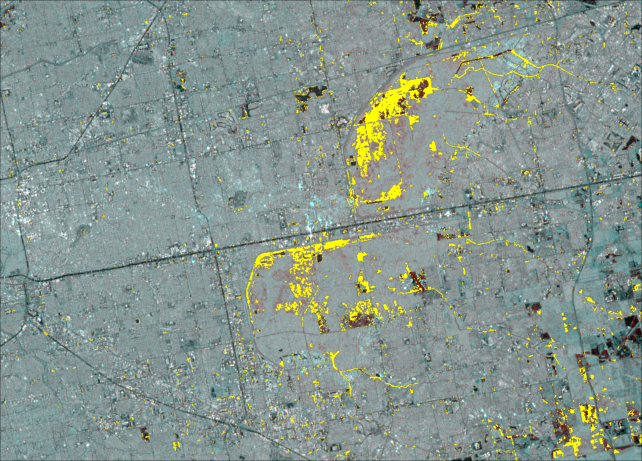

In [176]:
img_save = add_mask(imgVH,final_mask,(1,1,0))

#file_path = joinpath(figure_folder,"VH_flood_tuned")
#FileIO.save(file_path*".png",img_save)
#img_save

In [177]:
#file_path = joinpath(data_folder,"VHhand_tuned_mask")
#JLD.save(file_path*".jld", "data", final_mask)